In [6]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [8]:
class MyPredictor(object):
    """A Predictor class for an AI Platform custom prediction routine."""

    def __init__(self, content_tensor, style_tensor):
        """Style transfer class.
        
        content_tensor and style_tensor must be tensors representing the corresponding images
        """
        
        self.content_tensor = content_tensor
        self.style_tensor = style_tensor
        
        #self.content_image = None
        #self.style_image = None
    
    
    def format_tensor_to_image(self, t):
        max_dim = 512

        t = tf.image.convert_image_dtype(t, tf.float32)

        shape = tf.cast(tf.shape(t)[:-1], tf.float32)
        long_dim = max(shape)
        scale = max_dim / long_dim

        new_shape = tf.cast(shape * scale, tf.int32)

        t = tf.image.resize(t, new_shape)
        t = t[tf.newaxis, :]
        return t
    
    def get_content_tensor(self):
        return self.content_tensor
    
    def get_style_tensor(self):
        return self.style_tensor
    
    def merge_content_and_style(self):
        c = self.get_content_tensor()
        s = self.get_style_tensor()
        content_image = self.format_tensor_to_image(c)
        style_image = self.format_tensor_to_image(s)
        

        x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
        x = tf.image.resize(x, (224, 224))
        vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
        prediction_probabilities = vgg(x)


        vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')


        # Content layer where will pull our feature maps
        content_layers = ['block5_conv2'] 

        # Style layer of interest
        style_layers = ['block1_conv1',
                        'block2_conv1',
                        'block3_conv1', 
                        'block4_conv1', 
                        'block5_conv1']

        num_content_layers = len(content_layers)
        num_style_layers = len(style_layers)


        def vgg_layers(layer_names):
          """ Creates a vgg model that returns a list of intermediate output values."""
          # Load our model. Load pretrained VGG, trained on imagenet data
          vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
          vgg.trainable = False

          outputs = [vgg.get_layer(name).output for name in layer_names]

          model = tf.keras.Model([vgg.input], outputs)
          return model

        style_extractor = vgg_layers(style_layers)
        style_outputs = style_extractor(style_image*255)

        def gram_matrix(input_tensor):
          result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
          input_shape = tf.shape(input_tensor)
          num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
          return result/(num_locations)

        class StyleContentModel(tf.keras.models.Model):
          def __init__(self, style_layers, content_layers):
            super(StyleContentModel, self).__init__()
            self.vgg =  vgg_layers(style_layers + content_layers)
            self.style_layers = style_layers
            self.content_layers = content_layers
            self.num_style_layers = len(style_layers)
            self.vgg.trainable = False

          def call(self, inputs):
            "Expects float input in [0,1]"
            inputs = inputs*255.0
            preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
            outputs = self.vgg(preprocessed_input)
            style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                              outputs[self.num_style_layers:])

            style_outputs = [gram_matrix(style_output)
                             for style_output in style_outputs]

            content_dict = {content_name:value 
                            for content_name, value 
                            in zip(self.content_layers, content_outputs)}

            style_dict = {style_name:value
                          for style_name, value
                          in zip(self.style_layers, style_outputs)}

            return {'content':content_dict, 'style':style_dict}


        extractor = StyleContentModel(style_layers, content_layers)

        results = extractor(tf.constant(content_image))

        style_results = results['style']


        style_targets = extractor(style_image)['style']
        content_targets = extractor(content_image)['content']

        image = tf.Variable(content_image)


        def clip_0_1(image):
          return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

        opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)


        style_weight=1e-2
        content_weight=1e4

        def style_content_loss(outputs):
            style_outputs = outputs['style']
            content_outputs = outputs['content']
            style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                                   for name in style_outputs.keys()])
            style_loss *= style_weight / num_style_layers

            content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                                     for name in content_outputs.keys()])
            content_loss *= content_weight / num_content_layers
            loss = style_loss + content_loss
            return loss


        @tf.function()
        def train_step(image):
          with tf.GradientTape() as tape:
            outputs = extractor(image)
            loss = style_content_loss(outputs)

          grad = tape.gradient(loss, image)
          opt.apply_gradients([(grad, image)])
          image.assign(clip_0_1(image))


        import time
        start = time.time()

        #epochs = 10
        #steps_per_epoch = 100
        epochs = 10
        steps_per_epoch = 100

        step = 0
        for n in range(epochs):
          for m in range(steps_per_epoch):
            step += 1
            train_step(image)
            print(".", end='')
          #display.clear_output(wait=True)
          #display.display(tensor_to_image(image))
          merged_image = image
          #print("Train step: {}".format(step))

        #end = time.time()
        #print("Total time: {:.1f}".format(end-start))
        

        return merged_image  # tolist() needed for API deployment
    
    @classmethod
    def from_path(cls):
        """Creates an instance of MyPredictor using the given path.

        This loads artifacts that have been copied from your model directory in
        Cloud Storage. MyPredictor uses them during prediction.

        Returns:
            An instance of `MyPredictor`.
        """

        return cls

## Useful functions to get some results

In [9]:
def image_path_to_tensor(path):
    """
    path: path to the image
    return: image as a tensor
    """
    temp = tf.io.read_file(path)
    image_array = tf.image.decode_image(temp, channels=3)
    return image_array

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)
        
def imsave_show(image, path, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    plt.savefig(path)
    
def save_and_print(content_path, style_path):
    my_content_tensor = image_path_to_tensor(content_path)
    my_style_tensor = image_path_to_tensor(style_path)
    
    merge_style = MyPredictor(my_content_tensor, my_style_tensor)
    final_output = merge_style.merge_content_and_style()
    
    final_name = str(content_path + style_path)
    stamp = time.time()
    output_path = str("output/"+str(stamp)+'.jpg')
    
    imshow(my_content_tensor)
    plt.show()
    imshow(my_style_tensor)
    plt.show()
    imsave_show(final_output,output_path)
    plt.show()

    return final_output

# Fun results!

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

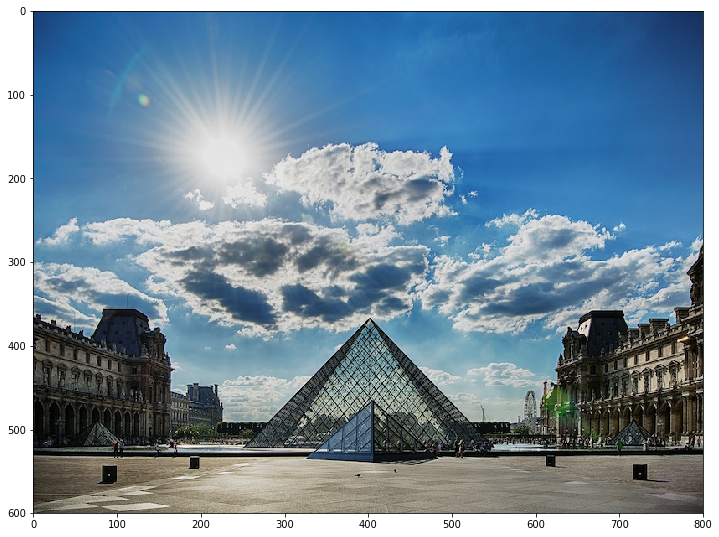

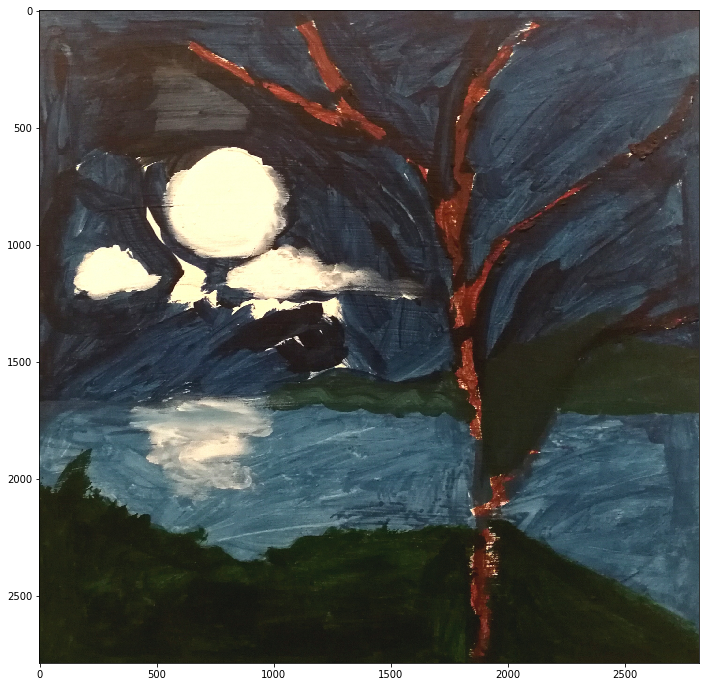

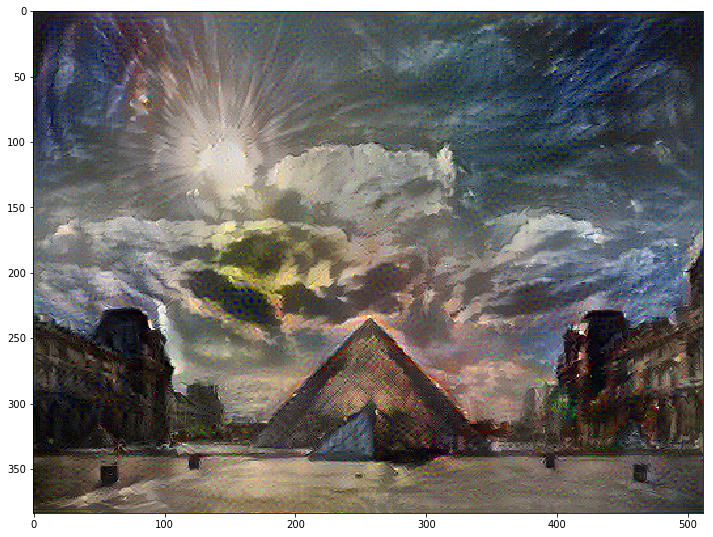

In [23]:
content_path = "images/louvre.jpg"
style_path = "images/anto_style.jpg"
merged = save_and_print(content_path, style_path)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

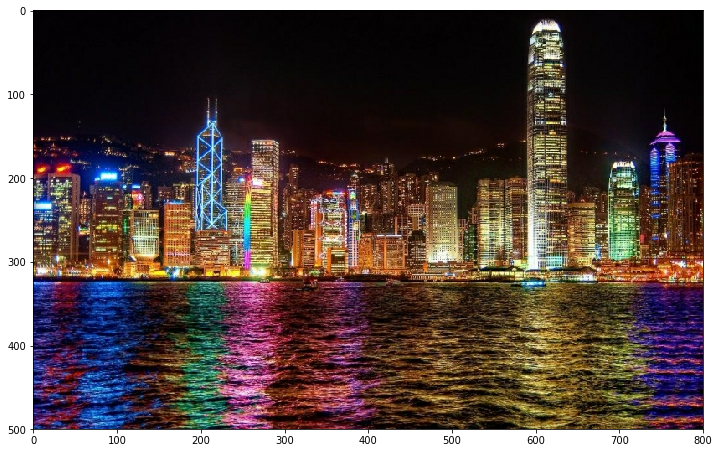

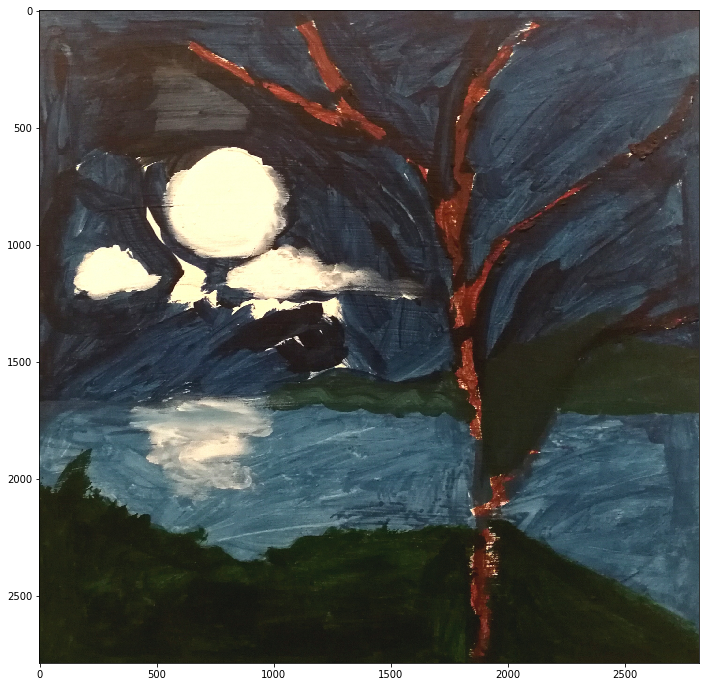

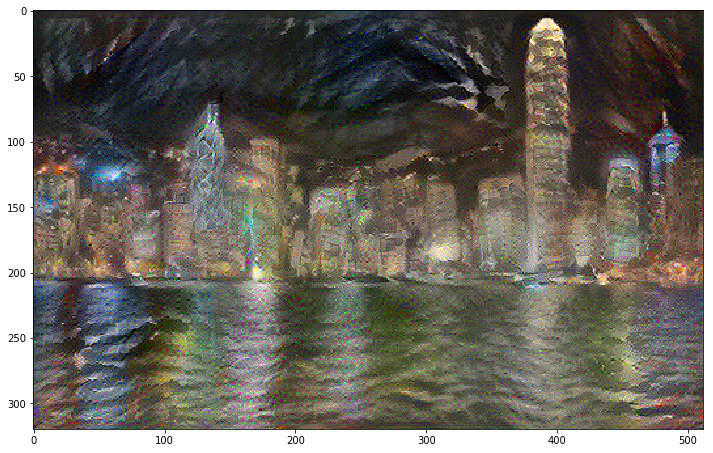

In [24]:
content_path = "images/hong_kong.jpg"
style_path = "images/anto_style.jpg"
merged = save_and_print(content_path, style_path)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

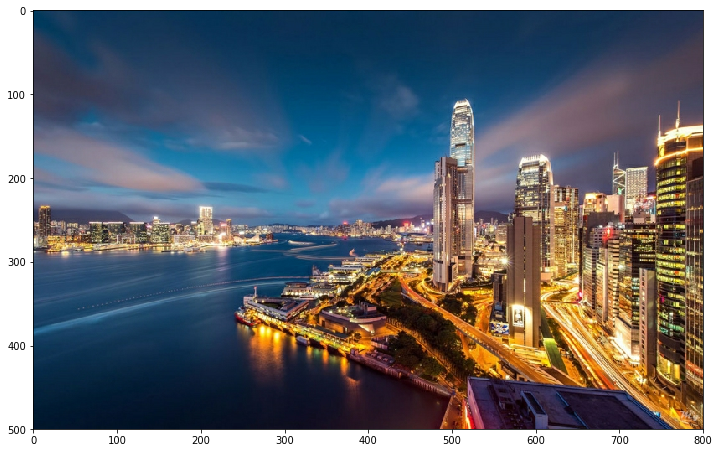

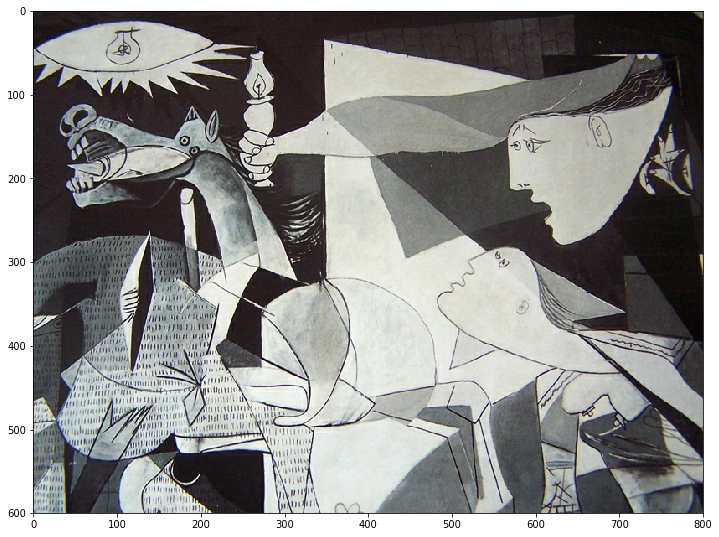

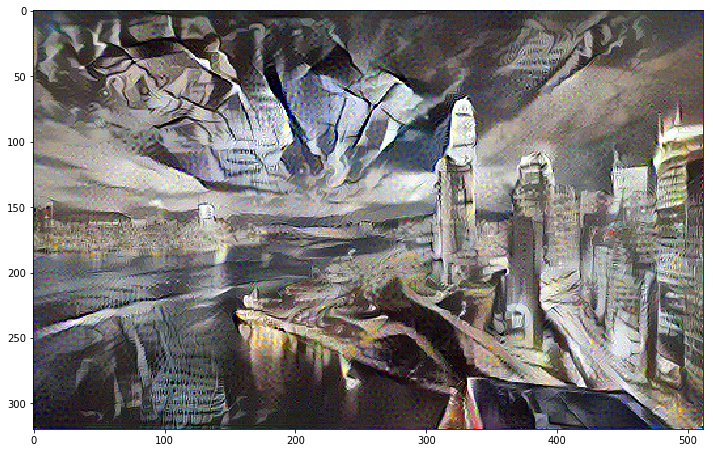

In [25]:
content_path = "images/hong_kong_2.jpg"
style_path = "images/guernica.jpg"
merged = save_and_print(content_path, style_path)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

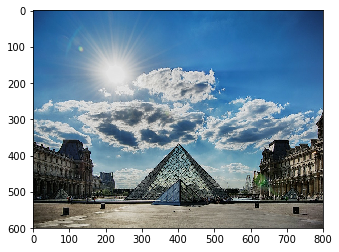

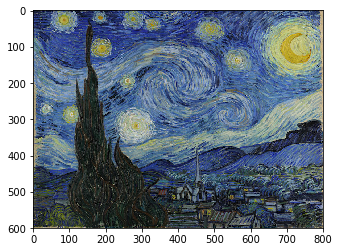

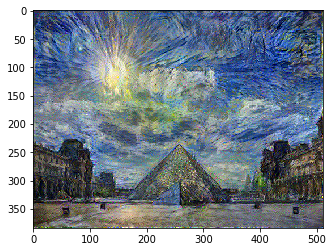

In [4]:
content_path = "images/louvre.jpg"
style_path = "images/StarryNight.jpg"
merged = save_and_print(content_path, style_path)

..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

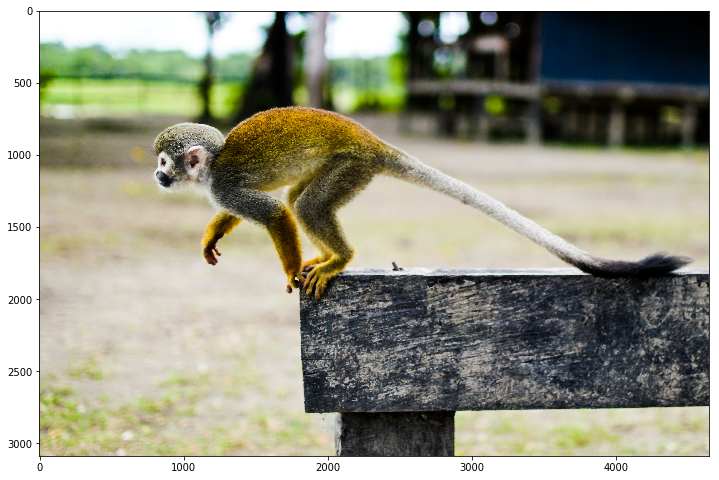

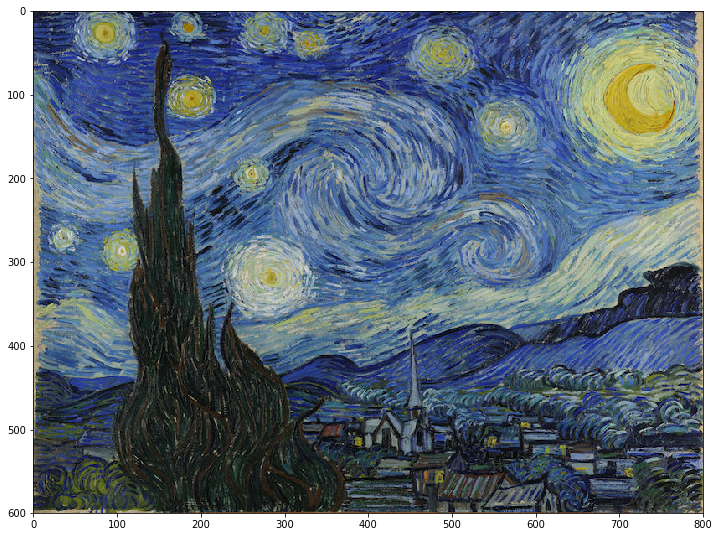

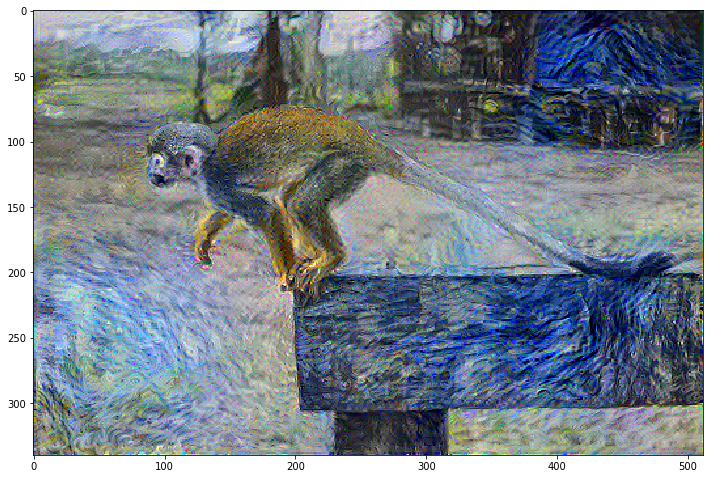

In [7]:
content_path = "images/monkey1.jpg"
style_path = "images/StarryNight.jpg"
merged = save_and_print(content_path, style_path)

In [ ]:
content_path = "images/monkey2.jpg"
style_path = "images/monet.jpg"
merged = save_and_print(content_path, style_path)

...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

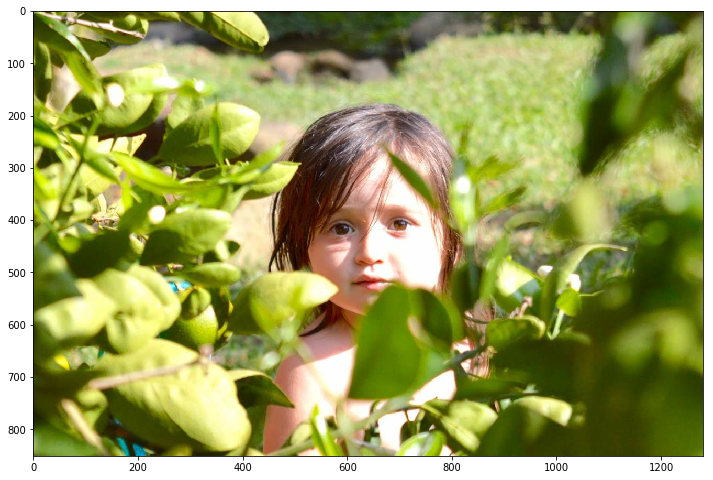

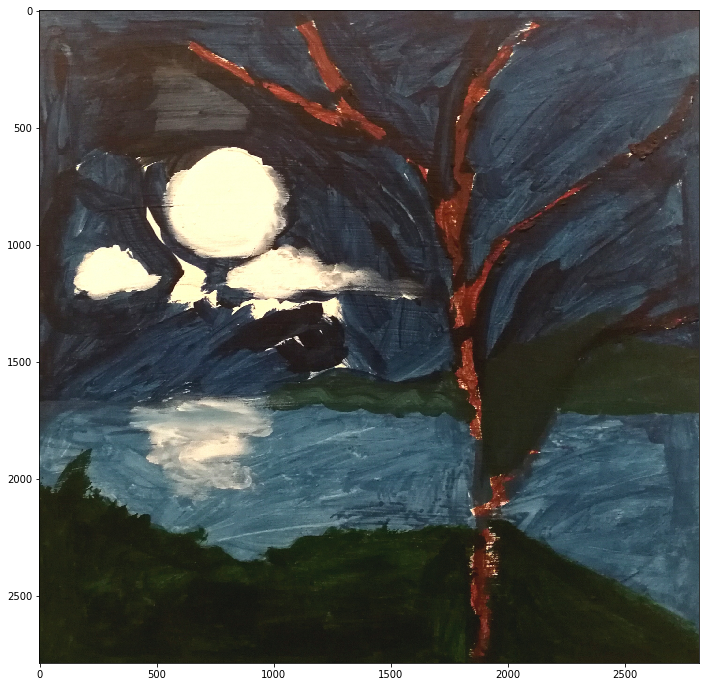

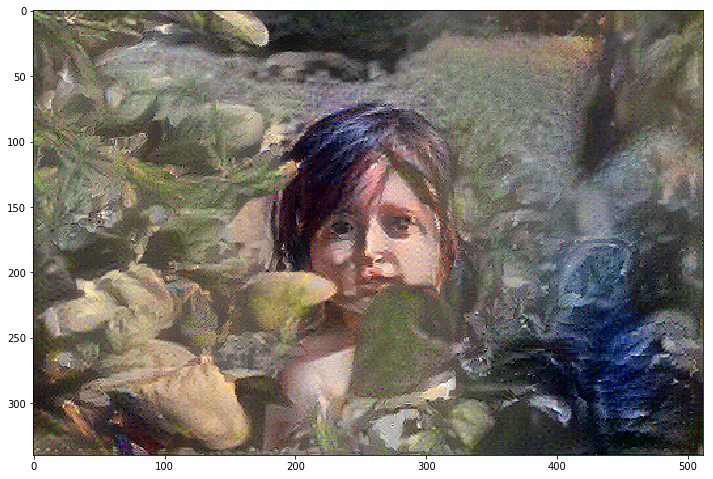

In [12]:
content_path = "images/anto.jpg"
style_path = "images/anto_style.jpg"
merged = save_and_print(content_path, style_path)

.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

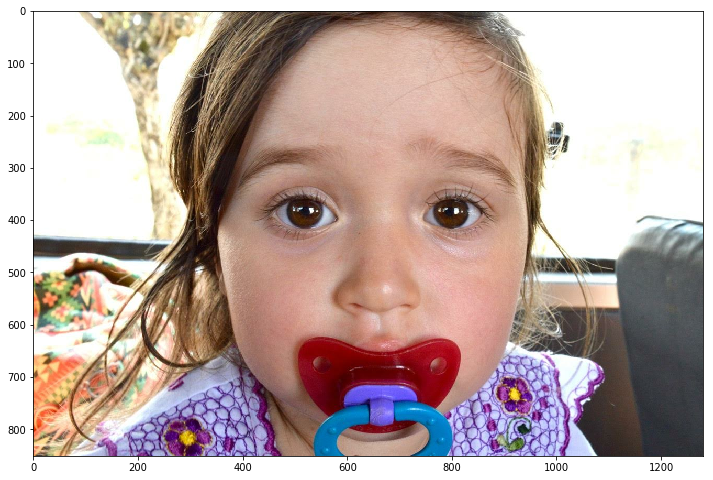

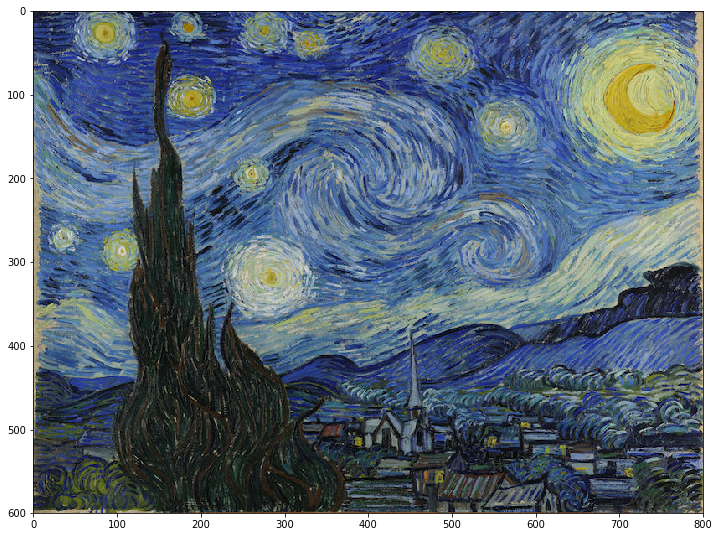

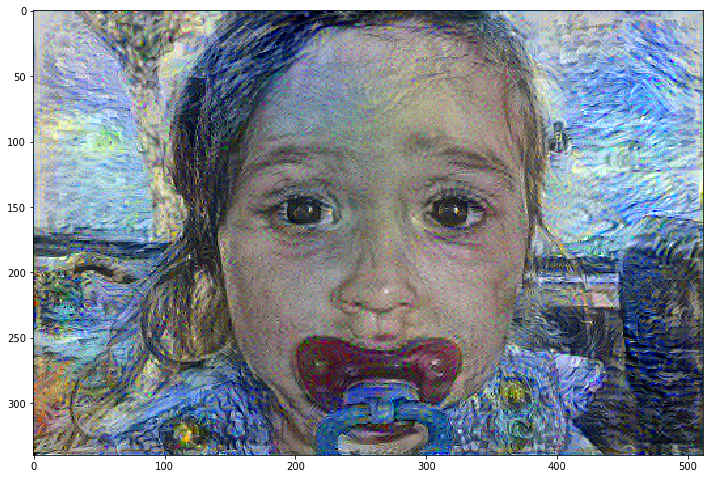

In [5]:
content_path = "images/anto2.jpg"
style_path = "images/StarryNight.jpg"
merged = save_and_print(content_path, style_path)